In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

In [2]:
%config Completer.use_jedi = False

# Albumentation을 통한 augmentation 적용 연습
* 먼저 샘플 이미지를 통한 연습과정을 거친 후에 CatnDog 데이터세트에 적용예정

In [3]:
!wget https://www.sciencenews.org/wp-content/uploads/2020/03/033120_HT_covid-cat_feat-1028x579.jpg
!ls -lia

--2024-02-27 14:21:44--  https://www.sciencenews.org/wp-content/uploads/2020/03/033120_HT_covid-cat_feat-1028x579.jpg
Resolving www.sciencenews.org (www.sciencenews.org)... 52.84.162.45, 52.84.162.27, 52.84.162.128, ...
Connecting to www.sciencenews.org (www.sciencenews.org)|52.84.162.45|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 61745 (60K) [image/jpeg]
Saving to: '033120_HT_covid-cat_feat-1028x579.jpg'

033120_HT_covid-cat 100%[===================>]  60.30K  --.-KB/s    in 0.05s   

2024-02-27 14:21:45 (1.08 MB/s) - '033120_HT_covid-cat_feat-1028x579.jpg' saved [61745/61745]

total 112
  1048584 drwxr-xr-x 2 root root  4096 Feb 27 14:21 .
271236566 drwxr-xr-x 6 root root  4096 Feb 27 14:21 ..
  1048586 -rw-r--r-- 1 root root 61745 Mar 31  2020 033120_HT_covid-cat_feat-1028x579.jpg
  1048585 ---------- 1 root root 37706 Feb 27 14:21 __notebook__.ipynb


(579, 1028, 3)


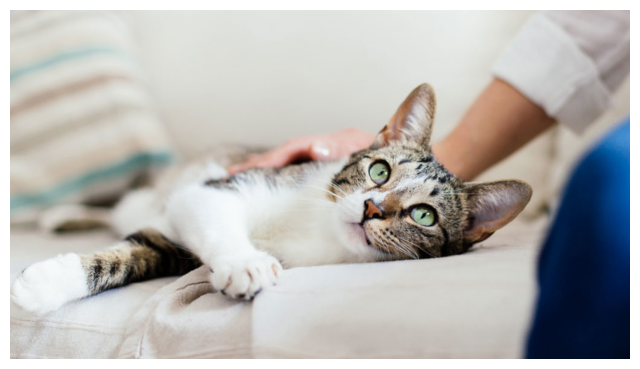

In [4]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

org_image = cv2.cvtColor(cv2.imread('033120_HT_covid-cat_feat-1028x579.jpg'), cv2.COLOR_BGR2RGB)

def show_image(image):
    plt.figure(figsize=(8,8))
    plt.imshow(image)
    plt.axis('off')
    
show_image(org_image)
print(org_image.shape)

In [5]:
import albumentations as A

augmentor = A.HorizontalFlip(p=0.8)
# image를 넣어줘야 작동한다.
aug_img2 = augmentor(image=org_image)

# 이미지라는 key를가진 dictionary가 반환된다.
print(aug_img2)  # dictionary
print(aug_img2.values())  # dictionary values
print(aug_img2['image'])  # numpy array

{'image': array([[[187, 178, 179],
        [187, 178, 179],
        [187, 178, 179],
        ...,
        [194, 205, 201],
        [193, 204, 200],
        [192, 203, 199]],

       [[187, 178, 179],
        [187, 178, 179],
        [187, 178, 179],
        ...,
        [195, 204, 201],
        [194, 205, 201],
        [193, 204, 200]],

       [[187, 178, 179],
        [187, 178, 179],
        [187, 178, 179],
        ...,
        [197, 206, 203],
        [196, 205, 202],
        [194, 205, 201]],

       ...,

       [[  2,   9,  28],
        [  2,   9,  28],
        [  2,   9,  28],
        ...,
        [182, 173, 168],
        [196, 189, 183],
        [193, 186, 180]],

       [[  2,   9,  28],
        [  2,   9,  28],
        [  2,   9,  28],
        ...,
        [179, 170, 165],
        [189, 182, 176],
        [184, 177, 171]],

       [[  2,   9,  28],
        [  2,   9,  28],
        [  2,   9,  28],
        ...,
        [193, 184, 179],
        [198, 191, 185],
        [189, 

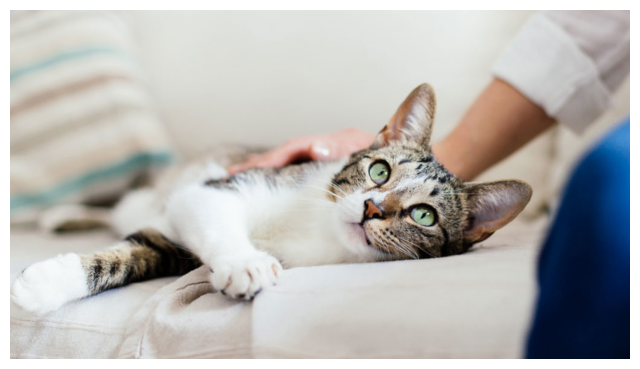

In [6]:
# albumentation도 구조상 functional api 형태이다.
# 객체 먼저 선언한 후에 이미지 값을 넣어줘야 한다.
augmentor = A.HorizontalFlip(p=0.5)
aug_img = augmentor(image=org_image)['image']
show_image(aug_img)

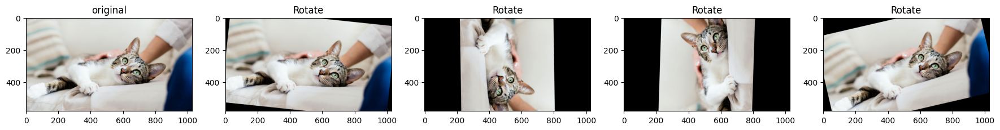

In [7]:
# 여러개의 이미지를 subplots로 시각화

def show_images(images, labels, ncols=4, title=None):
    figure, axs = plt.subplots(figsize=(22, 6), nrows=1, ncols=ncols)
    for i in range(ncols):
        axs[i].imshow(images[i])
        axs[i].set_title(labels[i])
        
# augmentor로 입력된 albumentations augmentation을 반복해서 수행
def repeat_aug(count=4, org_image=None, label=None, augmentor=None):
    image_list = [org_image]
    label_list = ['original']
    
    for i in range(count):
        aug_img = augmentor(image=org_image)['image']
        image_list.append(aug_img)
        label_list.append(label)
        
    show_images(image_list, label_list, ncols=count+1)
    
augmentor = A.Rotate(limit=90, p=1, border_mode=cv2.BORDER_CONSTANT)

repeat_aug(count=4, org_image=org_image, label='Rotate', augmentor=augmentor)


### Augmentation 적용 확률과 HorizontalFlip, VerticalFlip
* p 인자를 통해 해당 augmentation 적용 확률 설정
* HorizontalFlip은 좌우, VerticalFlip은 상하

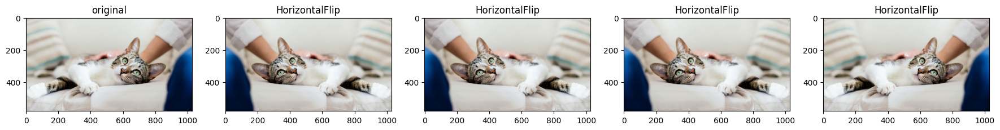

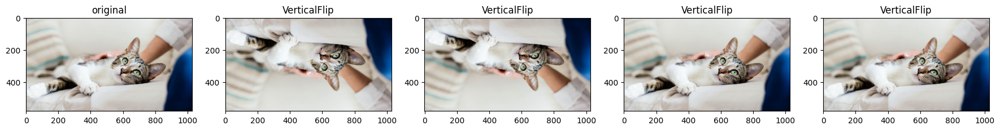

In [8]:
import albumentations as A

augmentor = A.HorizontalFlip(p=0.5)
aug_image = augmentor(image=org_image)['image']

repeat_aug(count=4, org_image=org_image, label='HorizontalFlip',augmentor=augmentor)

augmentor = A.VerticalFlip(p=0.5)
aug_image = augmentor(image=org_image)['image']

repeat_aug(count=4, org_image=org_image, label='VerticalFlip', augmentor=augmentor)

### Rotation
* 임의의 각도로 회전시키는 Rotate와 임의의 90도 각도(90도 간격 회전 90, 180, 270도)로 회전시키는 RandomRotate90

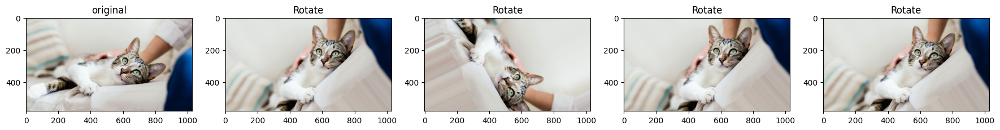

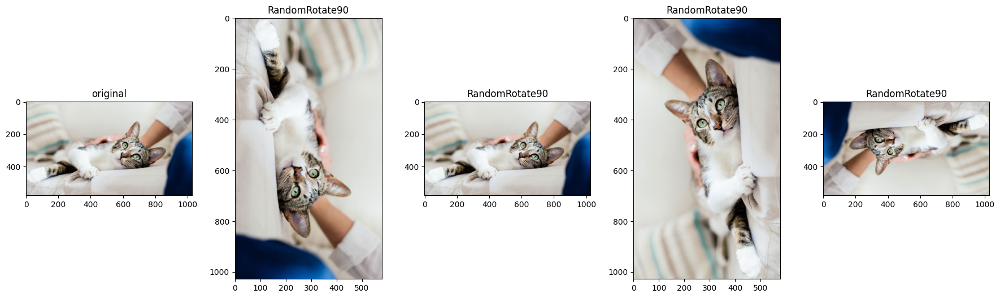

In [9]:
# 임의의 각도로 회전시키는 경우 -90 ~ +90도 회전
# 회전하면서 비는 이미지 영역은 bordermode를 통한 설정으로 대체

augmentor = A.Rotate(limit=90, p=1, border_mode=cv2.BORDER_REPLICATE)
repeat_aug(count=4, org_image=org_image, label='Rotate', augmentor=augmentor)

# RandomRotate90의 특징으론 이미지 사이즈가 바뀐다는 점이다.

augmentor = A.RandomRotate90(p=1)
repeat_aug(count=4, org_image=org_image, label='RandomRotate90', augmentor=augmentor)

### ShiftScaleRotation
* sift와 scale(zoom), rotate를 일부, 혹은 전부 적용할 수 있는 기능이다.
* 자주 쓰이니까 정확하게 알아두자

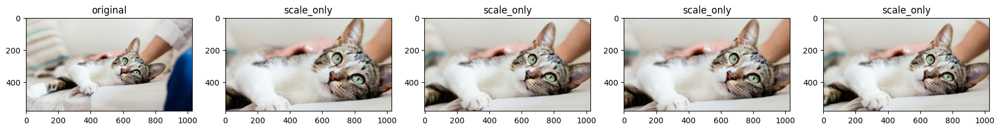

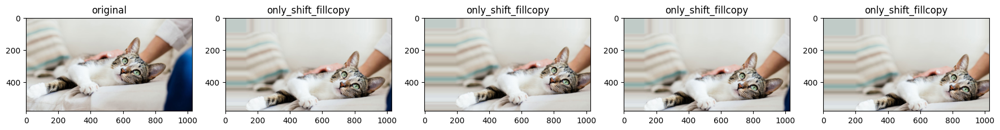

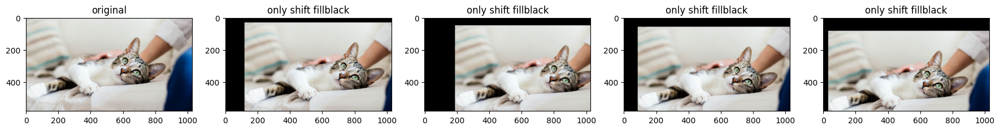

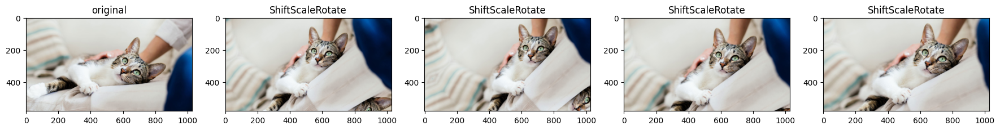

In [10]:
# shift와 rotate을 0으로 설정하면 scale 적용. scale을 0.5 ~ 1.0으로 설정

augmentor = A.ShiftScaleRotate(shift_limit=0, scale_limit=(0.5, 1.0), rotate_limit=0, p=1)
repeat_aug(count=4, org_image=org_image, label='scale_only', augmentor=augmentor)

# 이동 후에 남게 되는 Border를 Near 영역이미지로 복사
augmentor = A.ShiftScaleRotate(shift_limit=(0.2, 0.1), scale_limit=0, rotate_limit=0, border_mode= cv2.BORDER_REPLICATE ,p=1)
repeat_aug(count=4, org_image=org_image, label='only_shift_fillcopy', augmentor=augmentor)

# 이동 후에 남는 border를 검은색으로 채운다.
augmentor = A.ShiftScaleRotate(shift_limit=(0.2,0.01), scale_limit=0, rotate_limit=0, border_mode=cv2.BORDER_CONSTANT, p=1)
repeat_aug(count=4, org_image=org_image, label='only shift fillblack', augmentor=augmentor)

# 모든 효과 적용
augmentor = A.ShiftScaleRotate(p=1)
repeat_aug(count=4, org_image=org_image, label='ShiftScaleRotate', augmentor=augmentor)

### Compose()를 이용해 여러 Augmentation을 체인 형태로 적용

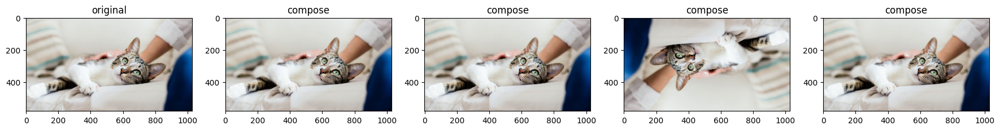

In [11]:
augmentor = A.Compose([
    A.VerticalFlip(p=0.5),
    A.HorizontalFlip(p=0.5)
])

repeat_aug(count=4, org_image=org_image, label='compose', augmentor=augmentor)

### 혹은 OneOf를 이용해 여러개의 변환 중 하나의 변환만 적용


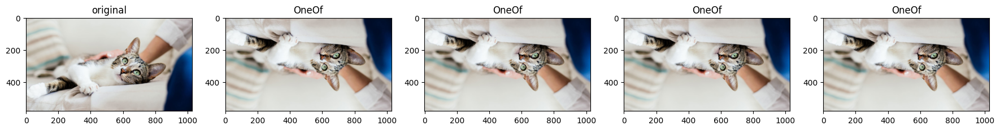

In [12]:
# OneOf() 내에서 VerticalFlip, HorizontalFlip, RandomBrightnessContrast를 각각을 p=1 로 부여했지만 연속해서 Augmentation이 적용 되지 않고, 개별 변환만 적용됨
augmentor = A.OneOf([
    A.VerticalFlip(p=1),
    A.HorizontalFlip(p=1),
    A.Rotate(limit=(45, 90), p=1, border_mode=cv2.BORDER_CONSTANT)
    ], p=1)
repeat_aug(count=4, org_image=org_image, label='OneOf', augmentor=augmentor)

### Compose와 Oneof 합치기

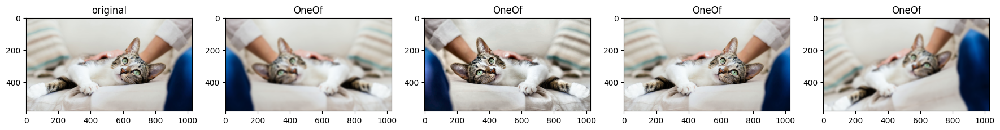

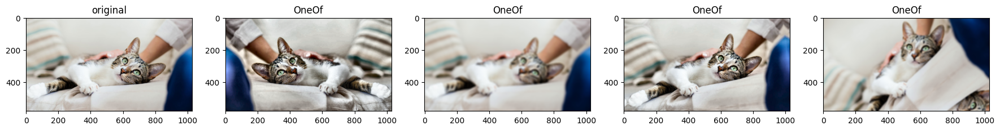

In [13]:
augmentor = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.ShiftScaleRotate(p=0.5),
    A.OneOf([
        A.CLAHE(p=0.3),
        A.Blur(blur_limit=(10, 15), p=0.3)
    ], p=0.5)
])
repeat_aug(count=4, org_image=org_image, label='OneOf', augmentor=augmentor)
repeat_aug(count=4, org_image=org_image, label='OneOf', augmentor=augmentor)

### Crop, CenterCrop, RandomCrop, RandomReSizedCrop
* Crop의 경우 입력된 height, width 값의 원본 이미지의 특정 영역을 잘라낸 후 원본 사이즈로 다시 resize하진 않는다.
* CenterCrop은 원본 이미지의 중심을 기준으로 입력된 height, width값 만큼의 영억을 crop한 뒤에 원본 이미지 사이즈로 resize하진 않는다.
* RandomCrop은 입력된 height, width 값 만큼의 영역을 random하게 crop한다. 원본 이미지 사이즈로 resize하지 않음.
* RandomResizedCrop은 원본 이미지의 특정 영역을 잘라낸 후, 입력된 height, width값의 사이즈로 resize한다.

(100, 400, 3)
(578, 1028, 3)


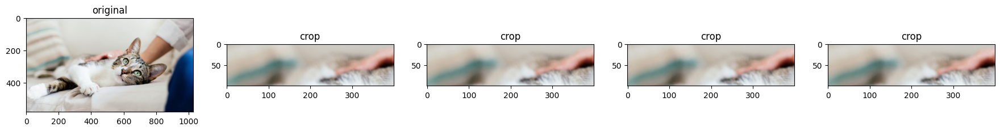

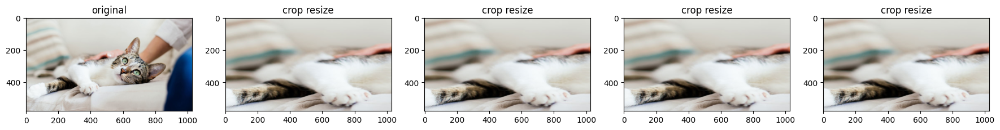

In [14]:
# Crop 이미지의 입력된 x,y 좌표만큼의 영역을 자르기
augmentor = A.Crop(x_min=100, y_min=200, x_max=500, y_max=300, p=1)
aug_image = augmentor(image=org_image)['image']
print(aug_image.shape)
repeat_aug(count=4, org_image=org_image, label='crop', augmentor=augmentor)

# Crop 적용한 후 resize
augmentor = A.Compose([
    A.Crop(x_min=100, y_min=100, x_max=500, y_max=500, p=1),
    A.Resize(578, 1028)
])

aug_image = augmentor(image=org_image)['image']
print(aug_image.shape)
repeat_aug(count=4, org_image=org_image, label='crop resize', augmentor=augmentor)


(300, 500, 3)
(578, 1028, 3)


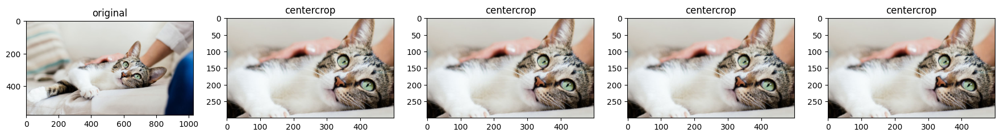

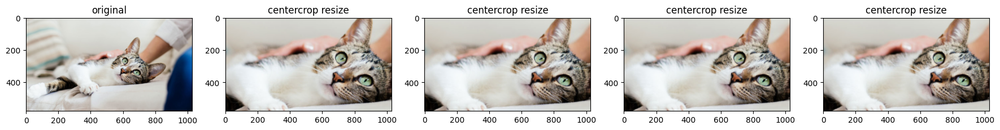

In [15]:
# CenterCrop 원본 이미지의 중심을 기준으로 자르기

augmentor = A.CenterCrop(height=300, width=500, p=1)
aug_image = augmentor(image=org_image)['image']

repeat_aug(count=4, org_image=org_image, label='centercrop', augmentor=augmentor)
print(aug_image.shape)

# 이미지 크기를 resize
augmentor = A.Compose([
    A.CenterCrop(height=300, width=500, p=1),
    A.Resize(578,1028)
])

aug_image = augmentor(image=org_image)['image']
print(aug_image.shape)
repeat_aug(count=4, org_image=org_image, label='centercrop resize', augmentor=augmentor)

(400, 800, 3)
(578, 1028, 3)


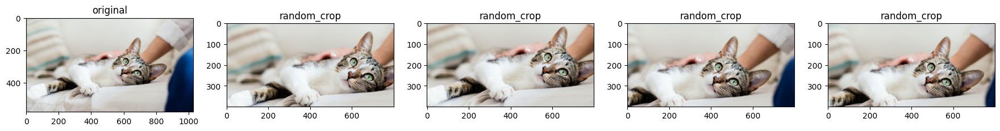

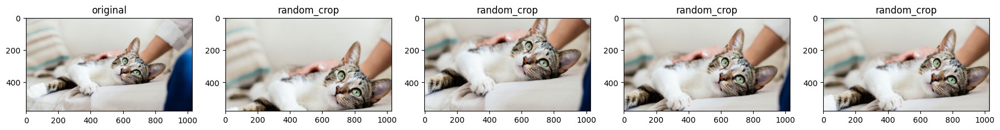

In [16]:
# RandomCrop height, width 값 만큼의 영역을 랜덤하게 자른다.

augmentor = A.RandomCrop(height=400, width=800, p=1)
aug_image = augmentor(image=org_image)['image']

repeat_aug(count=4, org_image=org_image, label='random_crop', augmentor=augmentor)
print(aug_image.shape)

augmentor = A.Compose([
    A.RandomCrop(height=400, width=800, p=1),
    A.Resize(578, 1028)
])

aug_image = augmentor(image=org_image)['image']
print(aug_image.shape)
repeat_aug(count=4, org_image=org_image, label='random_crop', augmentor=augmentor)

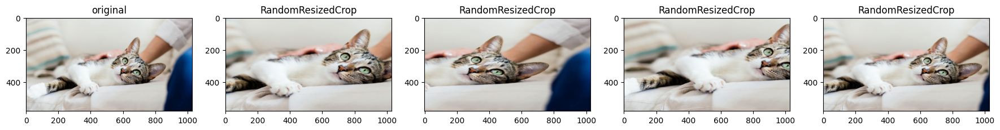

In [17]:
# scale은 crop할 임의의 영역의 원본 이미지 대비 크기 비율이다.
# 원본 height가 100, width가 100이고 scale이 (0.5, 1)인 경우 width * height를 50% ~100% 사이를 crop 한 뒤 입력된 height, width값으로 resize한다.
# ratio는 crop할 임의의 영역의 가로 세로 비율

augmentor = A.RandomResizedCrop(height=579, width=1028, scale=(0.5,0.9), p=1)
aug_image = augmentor(image=org_image)['image']
repeat_aug(count=4, org_image=org_image, label='RandomResizedCrop', augmentor=augmentor)

### RandomBrightnessContrast
* 밝기와 대비를 함께 조절

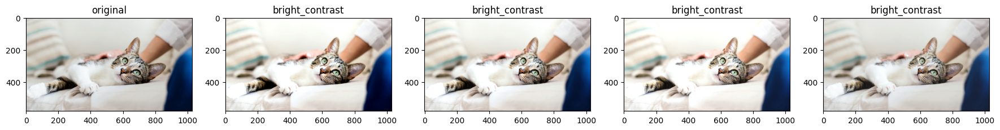

In [18]:
augmentor = A.RandomBrightnessContrast(brightness_limit=(-0.2,0.2), contrast_limit=(-0.2, 0.2), p=1)
repeat_aug(count=4, org_image=org_image, label='bright_contrast', augmentor=augmentor)

### HueSaturationValue()
* hue, staturation, value 각각을 특정 범위 내에서 임의로 변경
* 조정 범위는 / hue_shift_limit: -20 ~ 20(Default) sat_shift_limit: -30 ~ 30(Default) val_shift_limit: -20 ~ 20(Default)


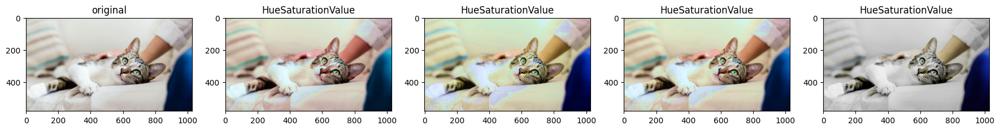

In [19]:
augmentor = A.HueSaturationValue(p=1)
repeat_aug(count=4, org_image=org_image, label='HueSaturationValue', augmentor=augmentor)

### RGBShift()
* RGB 각각을 특정 범위에서 임의로 변경
* 조절 parameter: r_shift_limit: -20 ~ 20(Default) g_shift_limit: -20 ~ 20(Default) b_shift_limit: -20 ~ 20(Default)

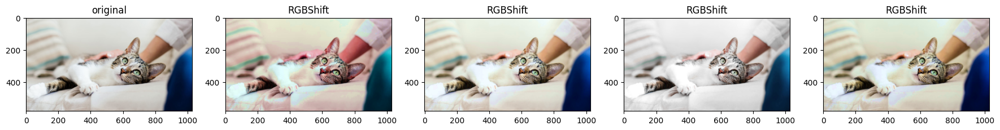

In [20]:
augmentation = A.RGBShift(p=1)
repeat_aug(count=4, org_image=org_image, label='RGBShift', augmentor=augmentor)

### ChannelShuffle()
* RGB 채널축을 임의로 변경

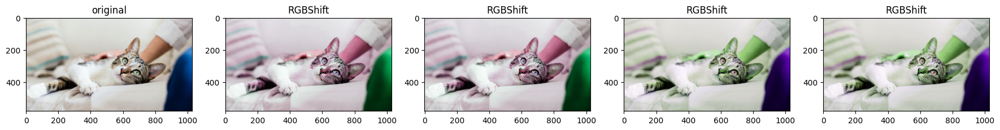

In [21]:
augmentor = A.ChannelShuffle(p=1)
repeat_aug(count=4, org_image=org_image, label='RGBShift', augmentor=augmentor)

### ColorJitter
* 밝기(Brightness), 대비(Contrast), 채도(Saturation), Hue(색상)을 임의값으로 변경.

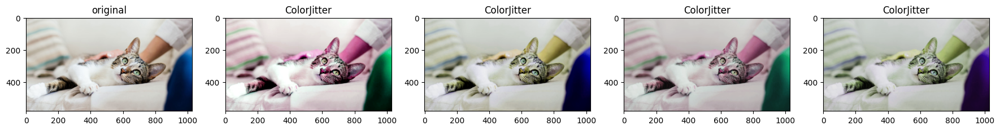

In [22]:
augmentor_hsv = A.ColorJitter(p=1)
repeat_aug(count=4, org_image=org_image, label='ColorJitter', augmentor=augmentor_hsv)

### Gaussian Noise
* 가우시안 분표를 갖는 noise를 원본 이미지에 추가

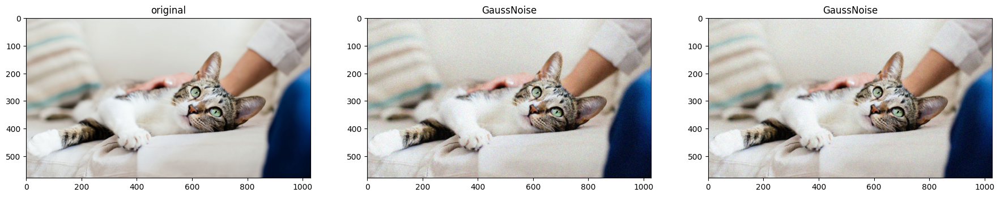

In [23]:
augmentor = A.GaussNoise(p=1, var_limit=(100, 200))
repeat_aug(count=2, org_image=org_image, label='GaussNoise', augmentor=augmentor)

### Cutout, CoarseDropout
* 임의의 noise hole을 원본 이미지에 추가. 둘의 차이는 전자는 정사각형 noise, 후자는 직사각형 noise의 차이

/opt/conda/lib/python3.10/site-packages/albumentations/augmentations/dropout/cutout.py:49: FutureWarning: Cutout has been deprecated. Please use CoarseDropout
  warnings.warn(


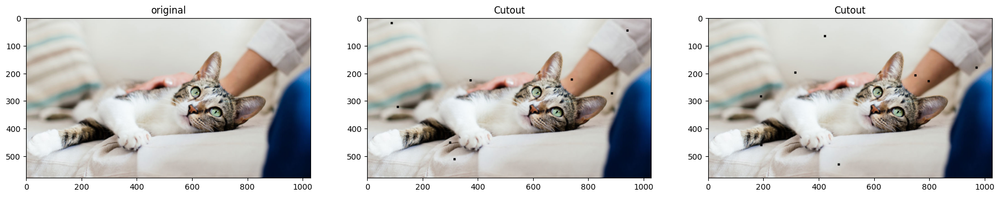

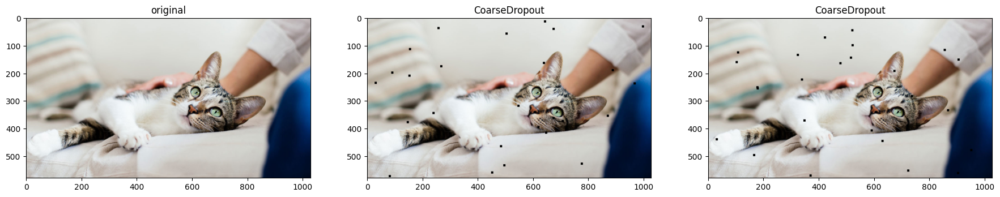

In [24]:
augmentor = A.Cutout(p=1)
repeat_aug(count=2, org_image=org_image, label='Cutout', augmentor=augmentor)

augmentor = A.CoarseDropout(p=1, max_holes=26)
repeat_aug(count=2, org_image=org_image, label='CoarseDropout', augmentor=augmentor)

### CLAHE(Contrast-limited adaptive histogram equalization)
* 발전된 histogram equalization 기법인 CLAHE를 적용하여 원본 이미지 보다 명암대비가 선명한 이미지 재생

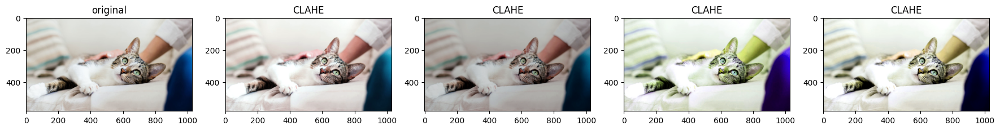

In [25]:
augmentor = A.CLAHE(clip_limit=4, p=1)
repeat_aug(count=4, org_image=org_image, label='CLAHE', augmentor=augmentor_hsv)

### Blur, GaussianBlur
* 전체적인 경계선을 흐리게 하거나 Noise를 제거하는 효과(Smoothing). blurring을 위한 filter 를 적용함. 
* 일반적인 Blur는 filter kernel size내의 픽셀값을 평균함. Gaussian Blur는 Gaussian 함수를 통해 kernel 값을 생성
* kernel size는 blur_limit 로 조절되며, kernel size가 클수록 이미지가 더 흐림. 
* Gaussian blur의 경우는 kernel size가 홀수가 되어야 함. 따라서 blur_limit에 짝수값은 입력 될 수 없음. 

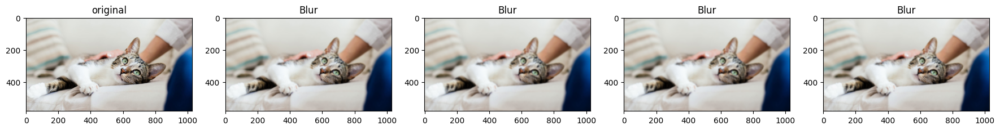

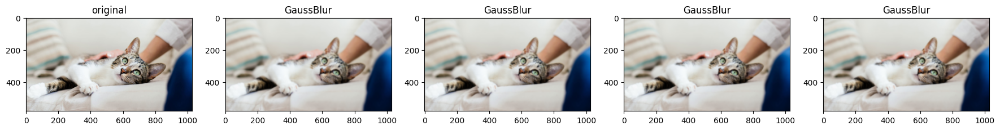

In [26]:
augmentor = A.Blur(p=1, blur_limit=(7, 10))
repeat_aug(count=4, org_image=org_image, label='Blur', augmentor=augmentor)

# GaussianBlur의 blur_limit 즉 kernel size는 홀수가 되어야 함. 따라서 blur_limit=(3, 8)과 같이 짝수를 입력하면 안됨. 
augmentor = A.GaussianBlur(p=1, blur_limit=(11, 15))
repeat_aug(count=4, org_image=org_image, label='GaussBlur', augmentor=augmentor)

### 날씨 효과와 같은 노이즈 추가

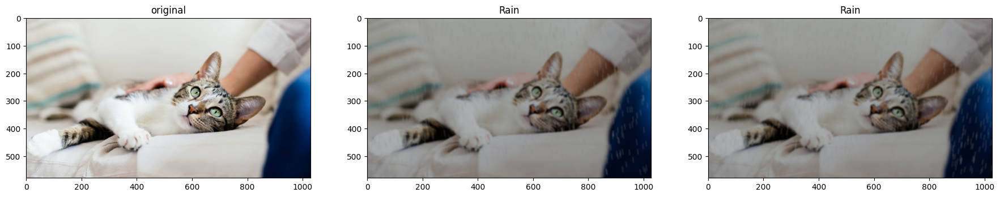

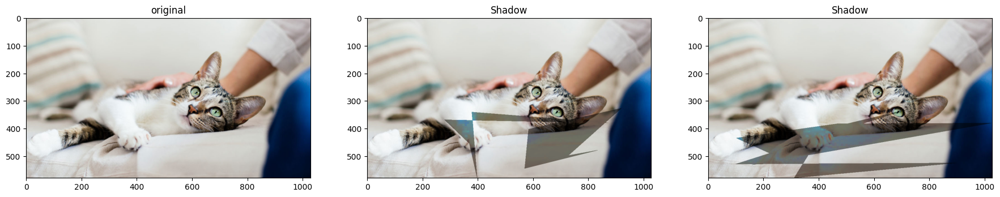

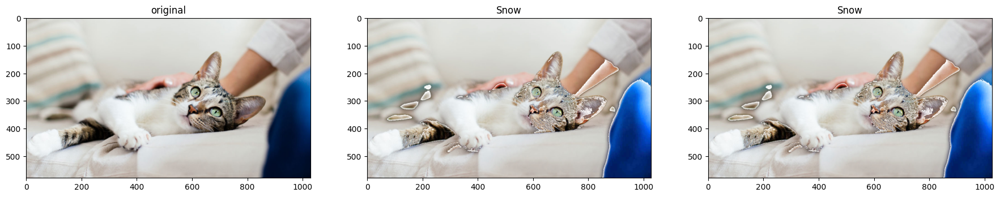

In [27]:
augmentor = A.RandomRain(p=1)
repeat_aug(count=2, org_image=org_image, label='Rain', augmentor=augmentor)

augmentor = A.RandomShadow(p=1)
repeat_aug(count=2, org_image=org_image, label='Shadow', augmentor=augmentor)

augmentor = A.RandomSnow(p=1)
repeat_aug(count=2, org_image=org_image, label='Snow', augmentor=augmentor)